In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')

In [2]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [3]:
sns.set_context('poster')

In [4]:
ppallete = "BuGn"
porder = ['MIT9313', 'Natl2A', 'C9B', 'MIT9312', 'MED4']
pedge = 'green'
apallete = "Oranges"
aorder = ['1A3', 'DE', 'DE1', 'ATCC', 'BS11']
aedge='orange'              

In [5]:
df = pd.read_pickle('CCPA.pkl.gz')

In [6]:
dfc = df.loc[(df.experiment.isin(['e3', 'e4','e5', 'e6'])) & (df.culture == 'Co_Culture')]

Text(0.5, 0.98, 'Progress per PRO (FL)')

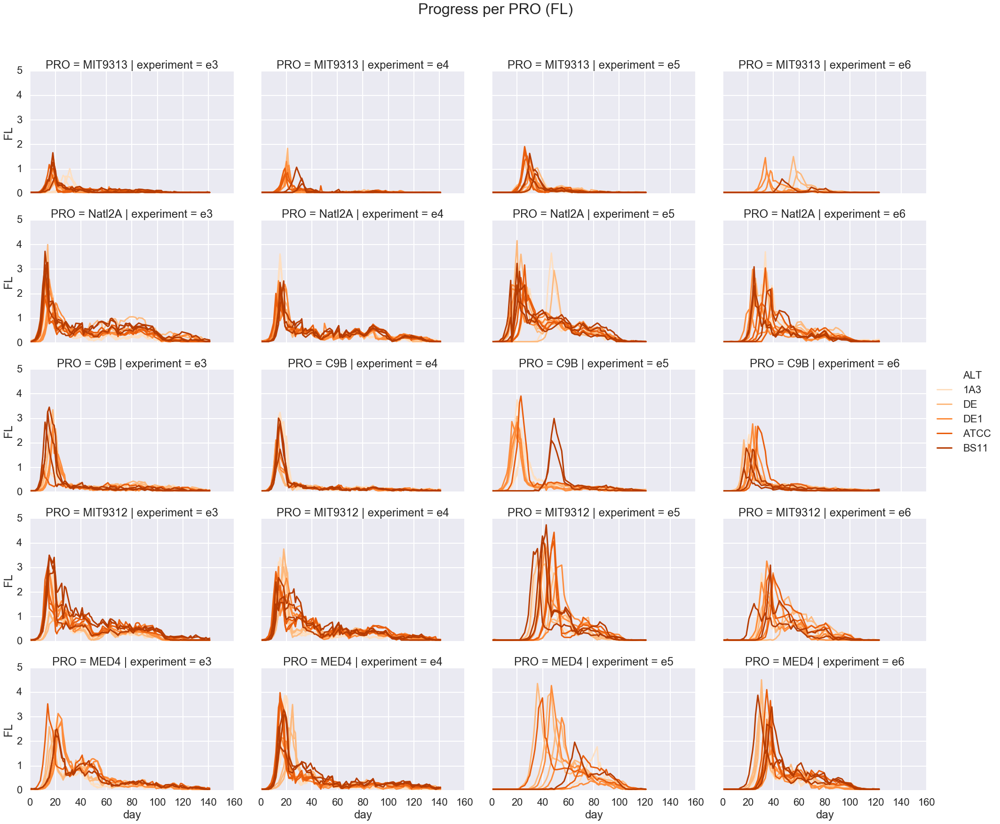

In [7]:
sns.relplot(data=dfc, x='day', y='FL', kind='line', #ci='sd',
#            col='PRO', hue='ALT', row='experiment', 
                           estimator=None, units='experiment_sample',
            row='PRO', hue='ALT', col='experiment', row_order=porder,

            palette=apallete, hue_order=aorder,
            aspect=1.4
           )
#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (FL)", fontsize=32)


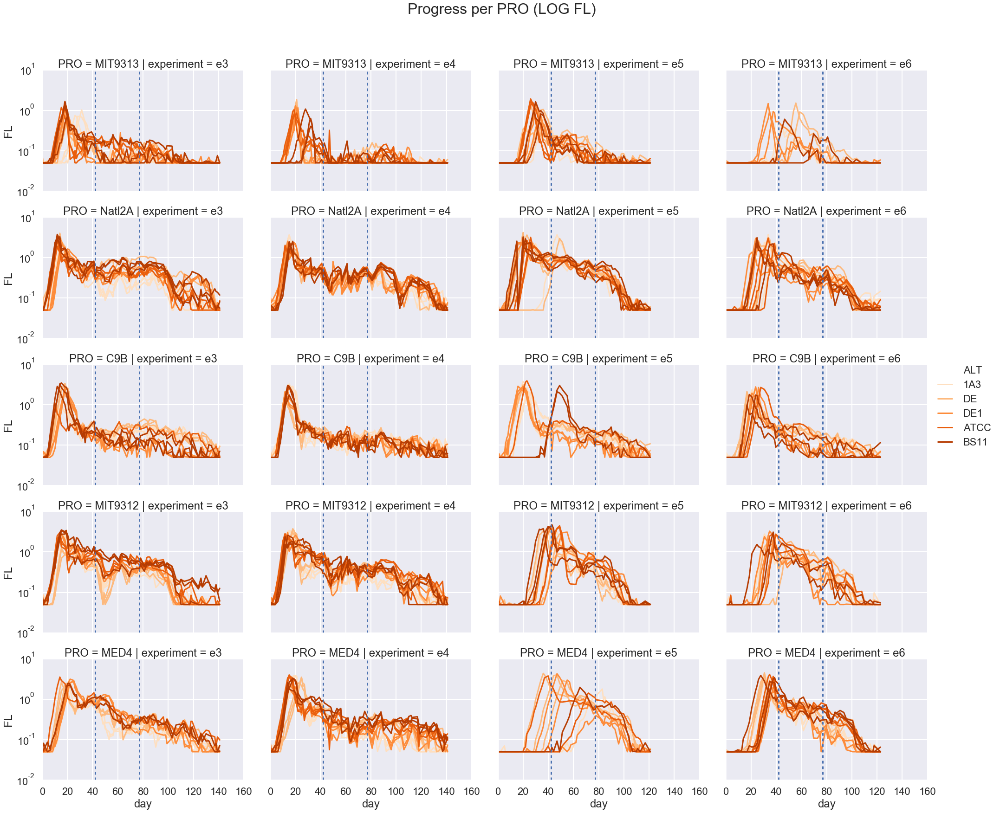

In [8]:
a= sns.relplot(data=dfc, x='day', y='FL', kind='line', 
               #ci='sd',
               estimator=None, units='experiment_sample',
            row='PRO', hue='ALT', col='experiment', row_order=porder,
            palette=apallete, hue_order=aorder,
            aspect=1.4
           )
a.fig.get_axes()[0].set_yscale('log')
for l in a.axes:
    for ax in l:
        ax.axvline(77, ls='--', label='17')
        ax.axvline(42, ls='--', label='23')
    
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (LOG FL)", fontsize=32)
plt.show()


Text(0.5, 0.98, 'Progress per PRO (cummulative sum of log FL)')

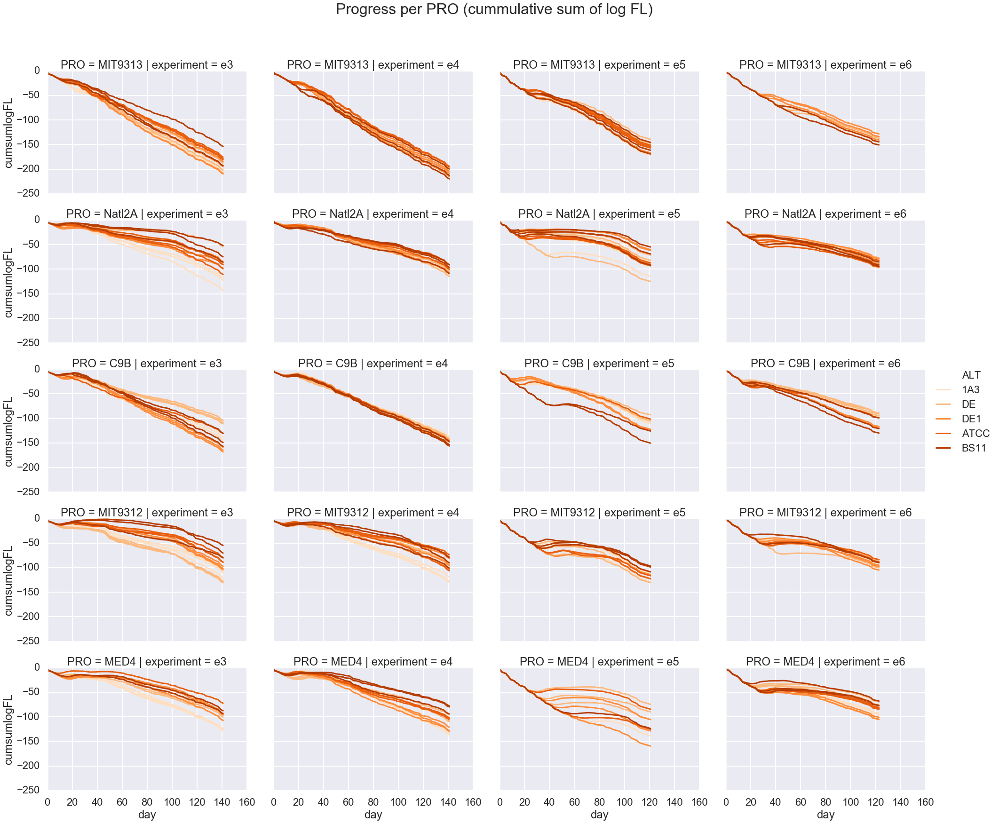

In [9]:
sns.relplot(data=dfc, x='day', y='cumsumlogFL', kind='line', #ci='sd',
            #col='PRO', hue='ALT', row='experiment', 
               estimator=None, units='experiment_sample',
            row='PRO', hue='ALT', col='experiment', row_order=porder,
            
            palette=apallete, hue_order=aorder,
            aspect=1.4
           )
#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (cummulative sum of log FL)", fontsize=32)


Text(0.5, 0.98, 'Progress per PRO (change rate of FL)')

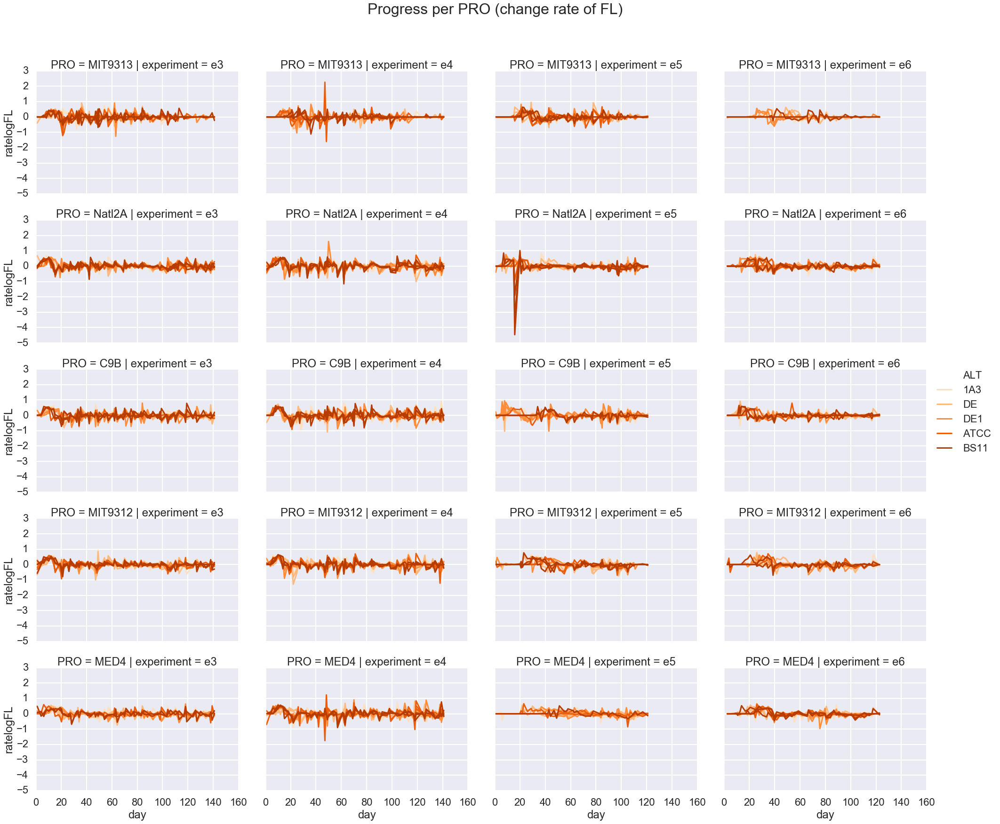

In [10]:
g=sns.relplot(data=dfc, x='day', y='ratelogFL', kind='line', #ci='sd',
               estimator=None, units='experiment_sample',
            row='PRO', hue='ALT', col='experiment', row_order=porder,
              
#            col='PRO', hue='ALT', row='experiment', 
            palette=apallete, hue_order=aorder,
            aspect=1.4
           )

#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (change rate of FL)", fontsize=32)


Text(0.5, 0.98, 'Progress per ALT (log FL)')

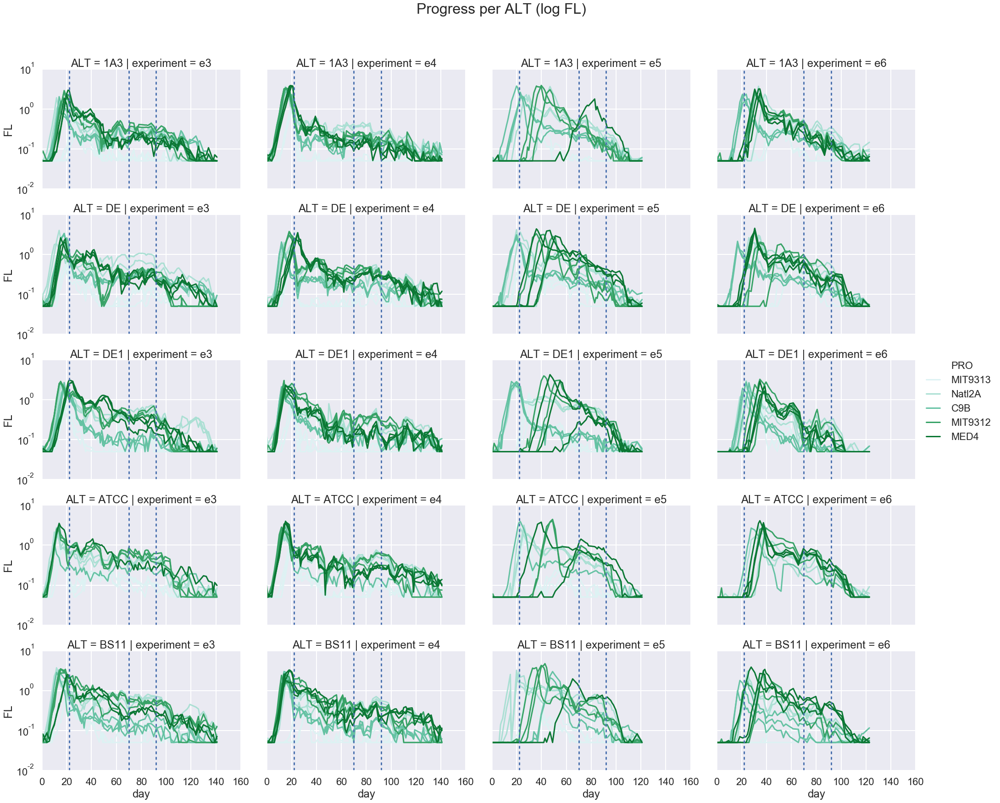

In [11]:
a= sns.relplot(data=dfc, x='day', y='FL', kind='line', #ci='sd',
               estimator=None, units='experiment_sample',
            row='ALT', hue='PRO', col='experiment', row_order=aorder,
            #hue='PRO', col='ALT', row='experiment',
            palette=ppallete, hue_order=porder,
           aspect=1.4)
a.fig.get_axes()[0].set_yscale('log')
for l in a.axes:
    for ax in l:
        ax.axvline(70, ls='--', label='17')
        ax.axvline(22, ls='--', label='23')
        ax.axvline(92, ls='--', label='50')
    
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT (log FL)", fontsize=32)


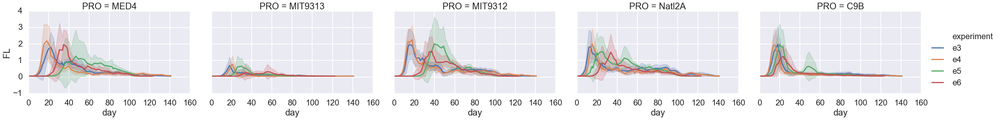

In [12]:
g =sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            col='PRO', aspect=1.4, #style='ALT',  #col='culture', #col='ALT', 
            
            hue='experiment') #, col_wrap=3)
#g.fig.get_axes()[0].set_yscale('log')

#plt.subplots_adjust(top=0.9)
#plt.suptitle("Progress per Experiment", fontsize=32)


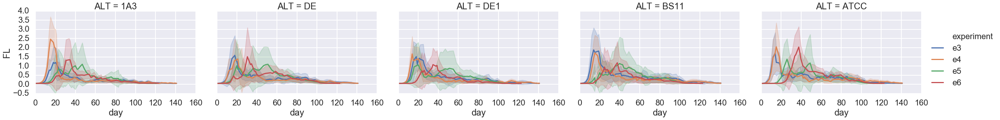

In [13]:
g= sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            col='ALT', aspect=1.4, #style='ALT',  #col='culture', #col='ALT', 
            
            hue='experiment') #, col_wrap=3)
#g.fig.get_axes()[0].set_yscale('log')

#plt.subplots_adjust(top=0.9)
#plt.suptitle("Progress per Experiment", fontsize=32)


# Features from Curves

In [14]:
g = cp.generate_features(dfc)

In [15]:
g.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'experiment', 'sample',
       'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decay_half_day',
       'decay_half_val', 'decay_log_half_day', 'decay_log_half_val',
       'decay_tenth_day', 'decay_tenth_val', 'decay_log_tenth_day',
       'decay_log_tenth_val', 'decay_log_intercept', 'decay_lo

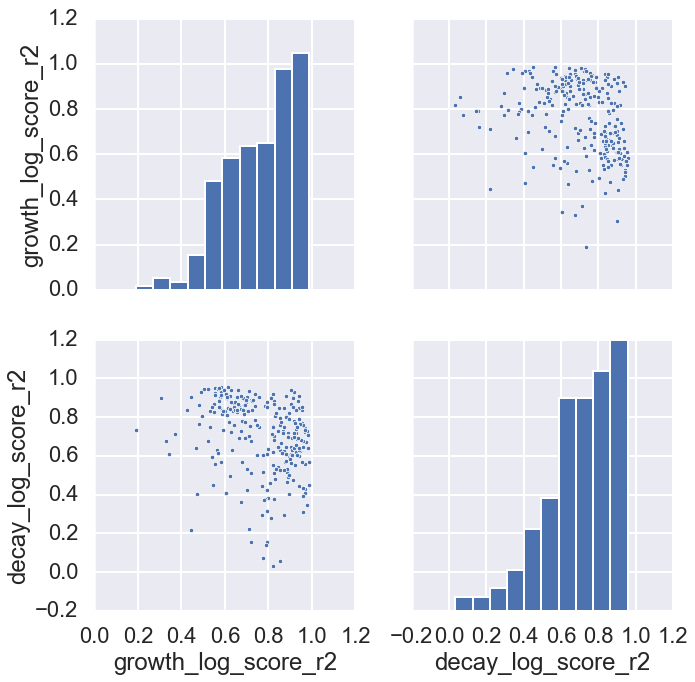

In [16]:
#sns.pairplot(data=g.loc[[]], x='growth_log_score_r2' ,y='decay_log_score_r2')
sns.pairplot(data=g.loc[g.max_day > -1,['growth_log_score_r2' ,'decay_log_score_r2']], height=5)

In [18]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample')

C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


Variance percent explained
 [0.3873703  0.20153907]


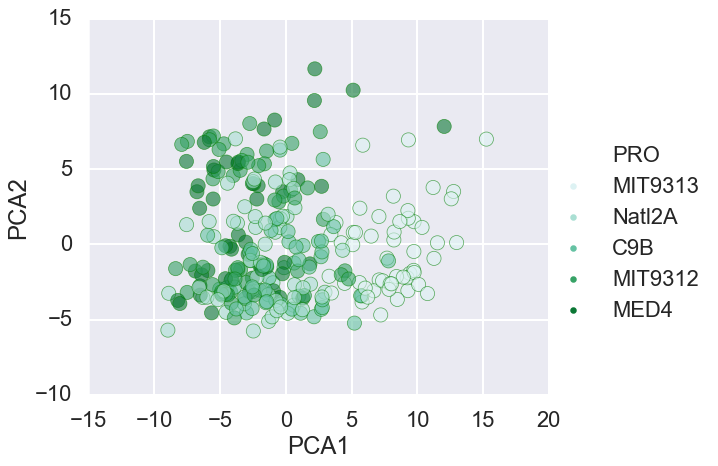

In [19]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder,edgecolor=pedge,
           )

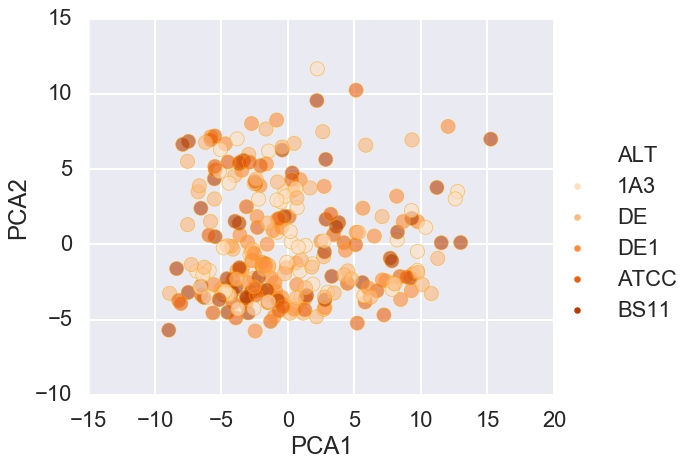

In [20]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2, 
                       palette=apallete, hue_order=aorder, edgecolor=aedge,
)

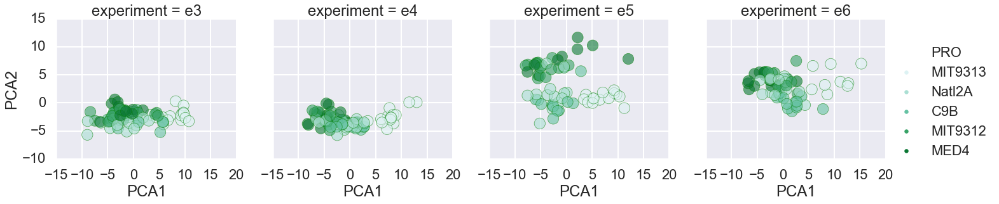

In [21]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', s=300, alpha=0.6,
            col='experiment', height=5,
                       palette=ppallete, hue_order=porder, edgecolor=pedge,
)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

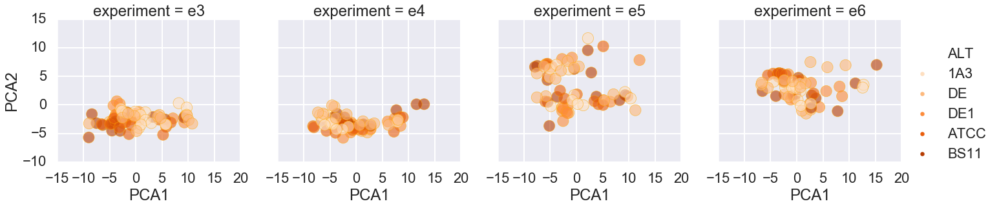

In [22]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', s=300, alpha=0.6,
            col='experiment', height=5,
                                   palette=apallete, hue_order=aorder, edgecolor=aedge,

           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [111]:
X = cp.features2X(g)
y = g['PRO']
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.5443548387096774


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


accuracy: 1.0
              precision    recall  f1-score   support

         C9B       1.00      1.00      1.00        51
        MED4       1.00      1.00      1.00        52
     MIT9312       1.00      1.00      1.00        56
     MIT9313       1.00      1.00      1.00        52
      Natl2A       1.00      1.00      1.00        59

   micro avg       1.00      1.00      1.00       270
   macro avg       1.00      1.00      1.00       270
weighted avg       1.00      1.00      1.00       270



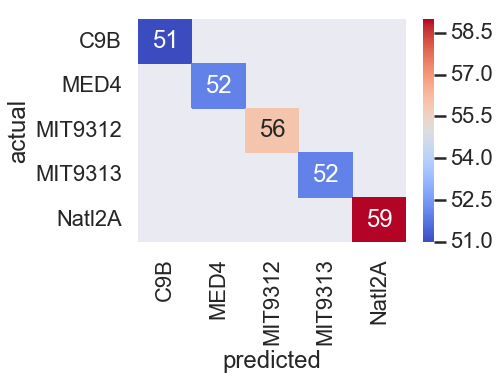

In [24]:
cp.forest_heatmap(clf=clf, X=X, y=y)

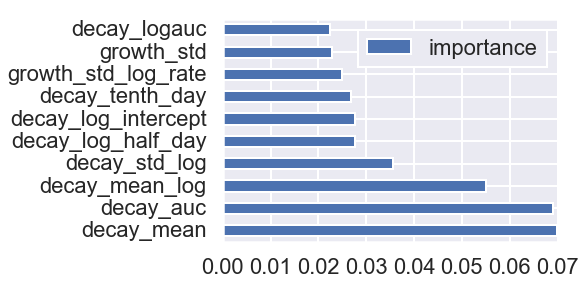

In [25]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

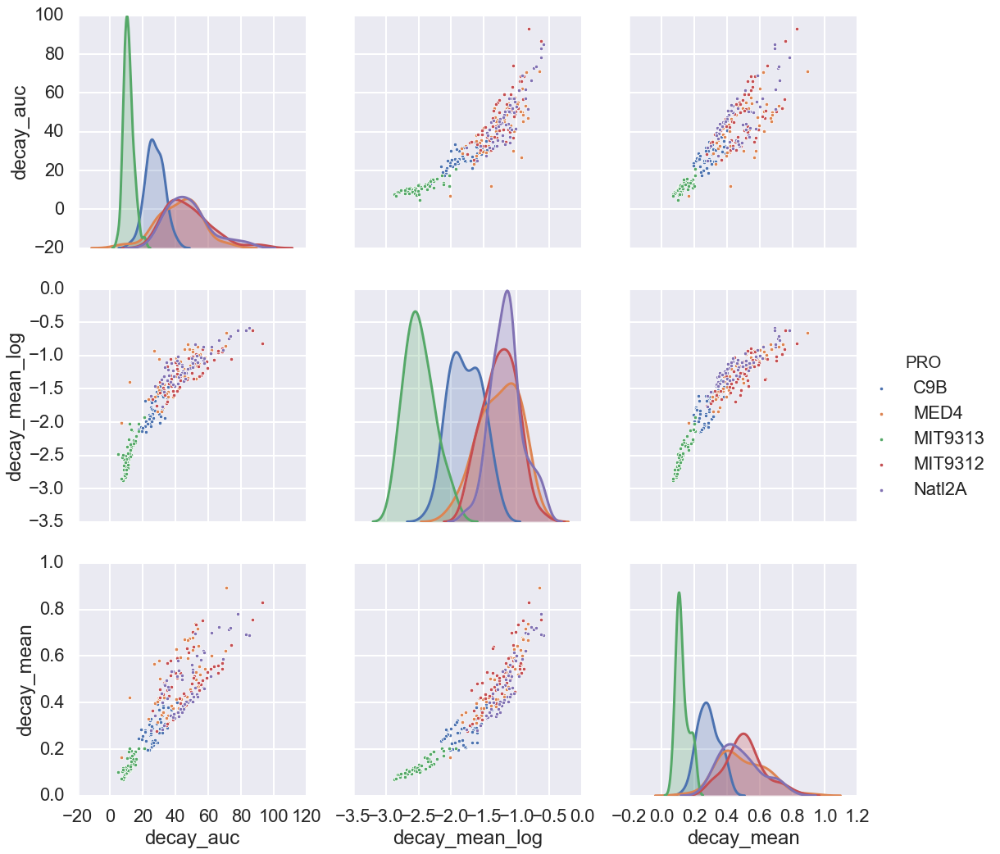

In [26]:
sns.pairplot(data=g.loc[:, ['decay_auc', 'decay_mean_log', 'decay_mean', 'PRO']], height=5, hue='PRO')

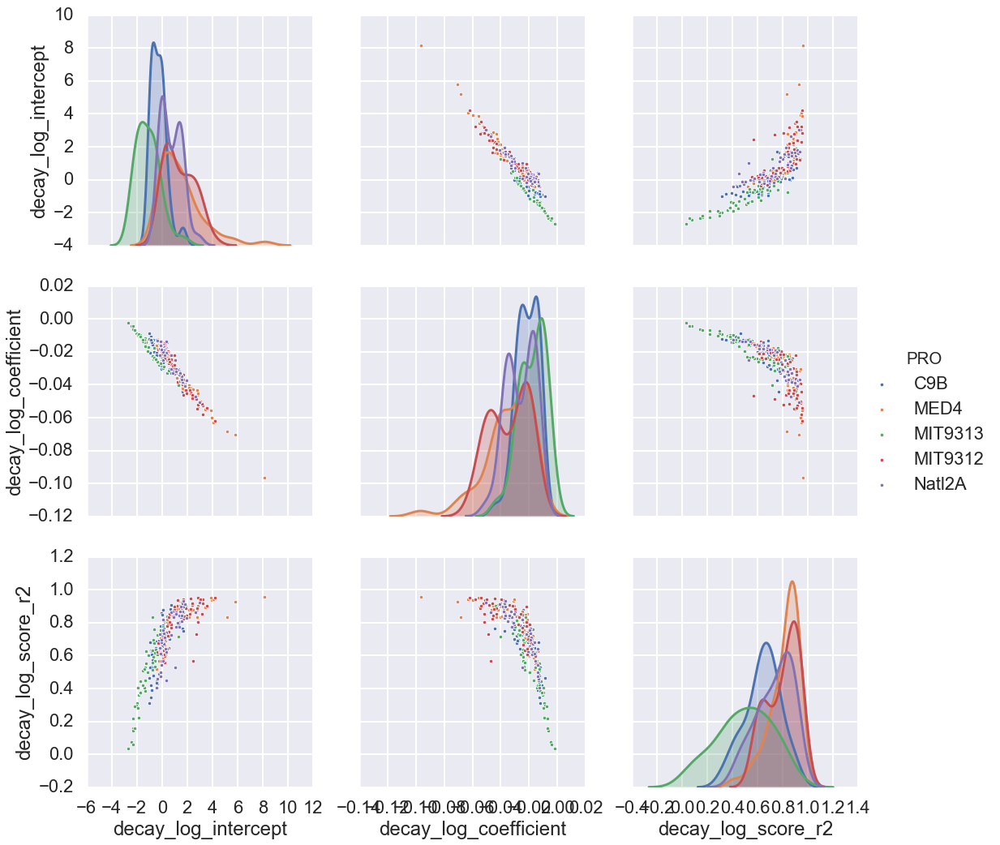

In [27]:
sns.pairplot(data=g.loc[:, ['decay_log_intercept', 'decay_log_coefficient',
       'decay_log_score_r2', 'PRO']], height=5, hue='PRO')


In [28]:
df1 = df.loc[df.experiment == 'e1']

In [29]:
g1 = cp.generate_features(df1)

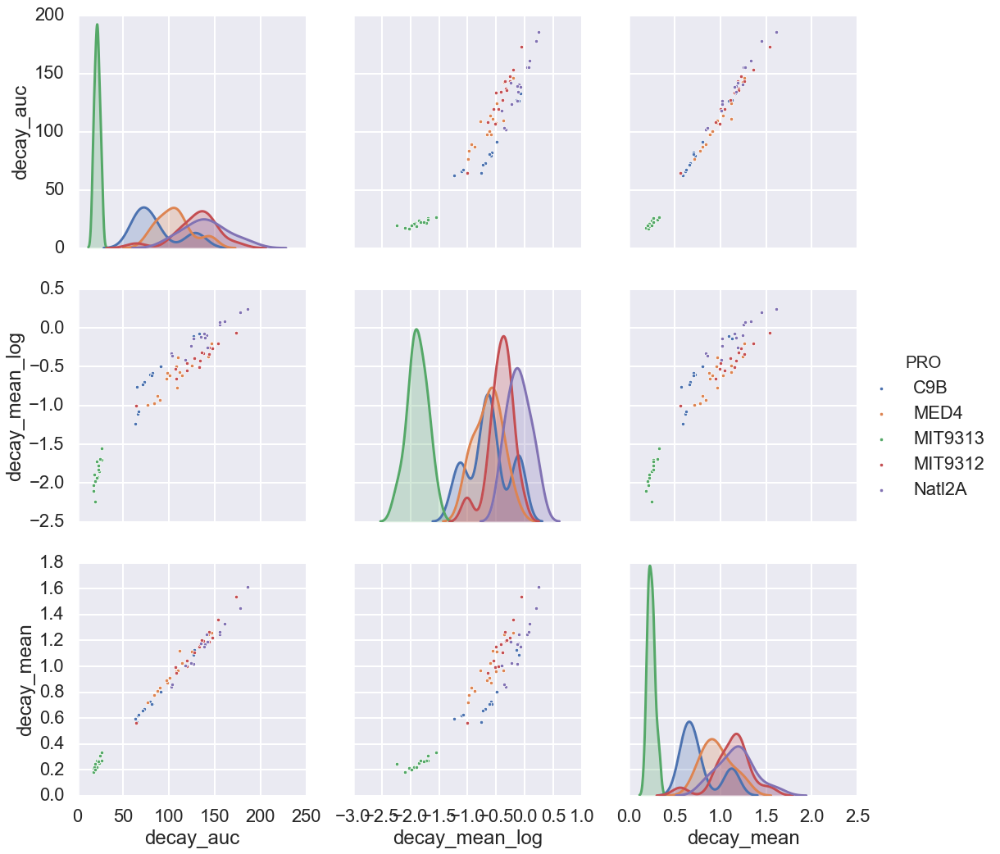

In [30]:
sns.pairplot(data=g1.loc[g1.culture== 'Co_Culture', ['decay_auc', 'decay_mean_log', 'decay_mean', 'PRO']], height=5, hue='PRO')

C:\Users\Osnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\Osnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


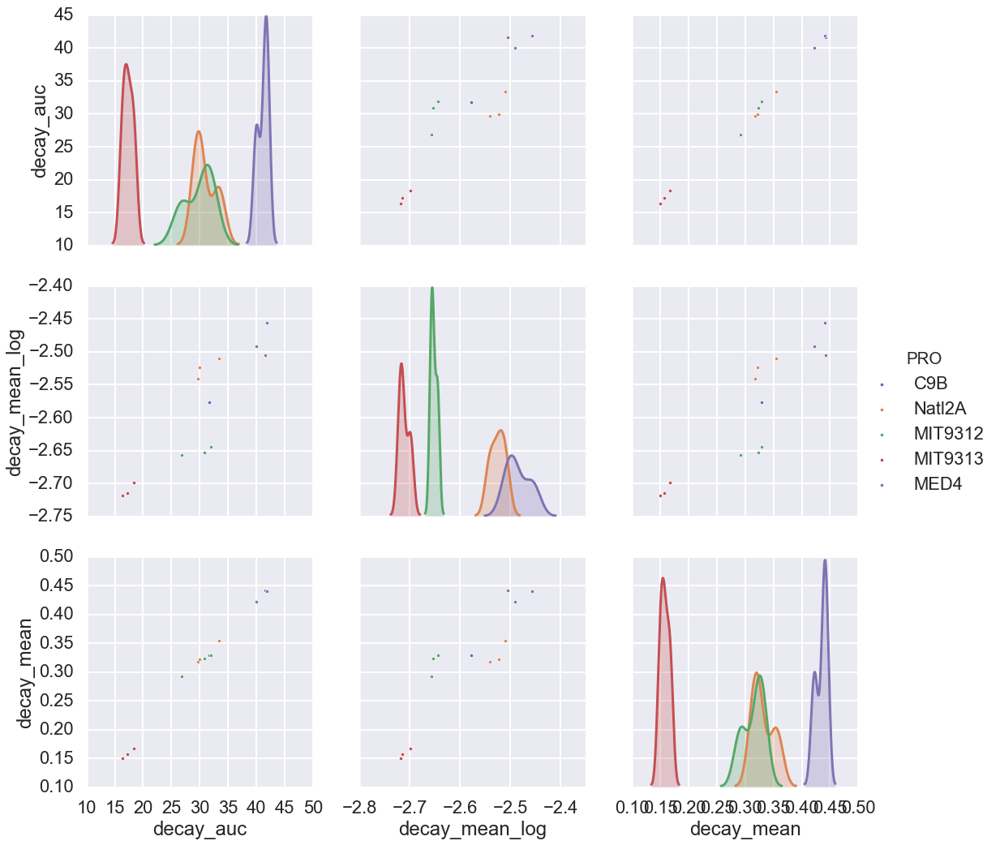

In [31]:
sns.pairplot(data=g1.loc[g1.culture== 'Axenic', ['decay_auc', 'decay_mean_log', 'decay_mean', 'PRO']], height=5, hue='PRO')

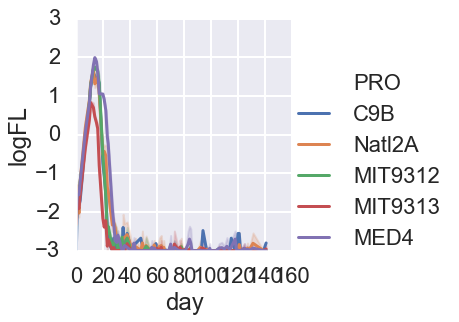

In [32]:
sns.relplot(data=df.loc[df.culture== 'Axenic'], height=5, hue='PRO', x='day', y='logFL', kind='line')

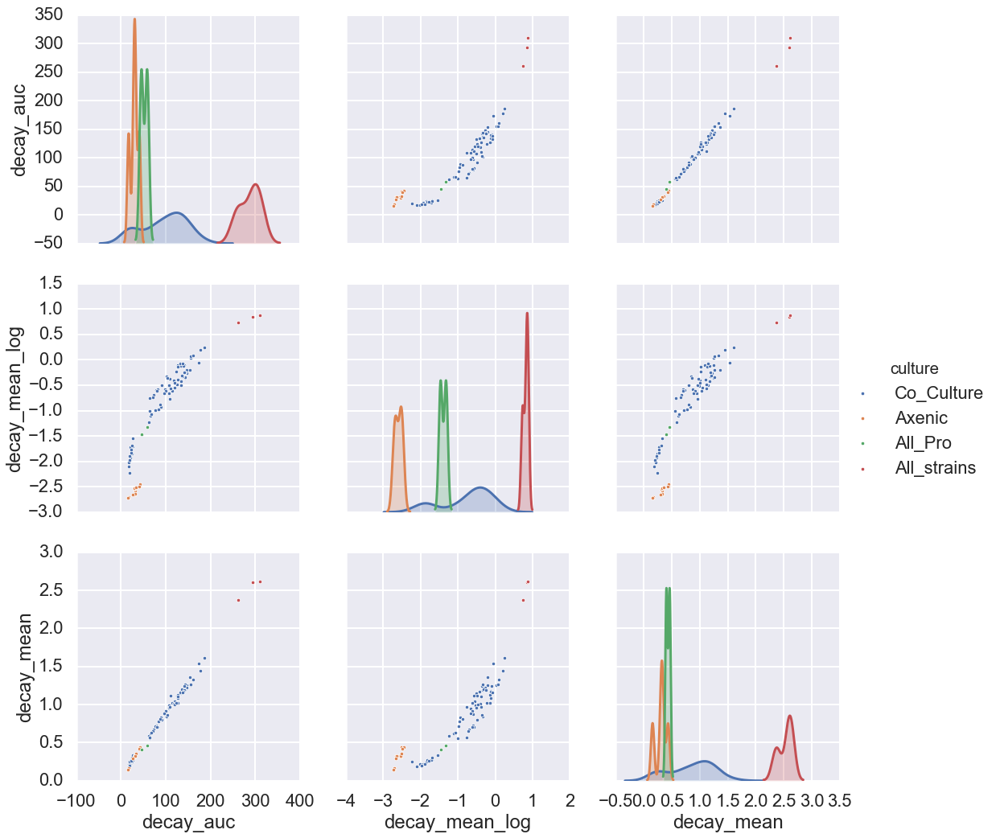

In [33]:
sns.pairplot(data=g1.loc[:, ['decay_auc', 'decay_mean_log', 'decay_mean', 'culture']], height=5, hue='culture')

In [110]:
X = cp.features2X(g)
y = g['ALT']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.3629032258064516


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


accuracy: 1.0
              precision    recall  f1-score   support

         1A3       1.00      1.00      1.00        55
        ATCC       1.00      1.00      1.00        44
        BS11       1.00      1.00      1.00        54
          DE       1.00      1.00      1.00        58
         DE1       1.00      1.00      1.00        59

   micro avg       1.00      1.00      1.00       270
   macro avg       1.00      1.00      1.00       270
weighted avg       1.00      1.00      1.00       270



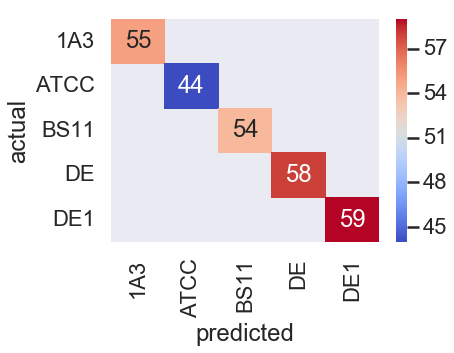

In [35]:
cp.forest_heatmap(clf=clf, X=X, y=y)

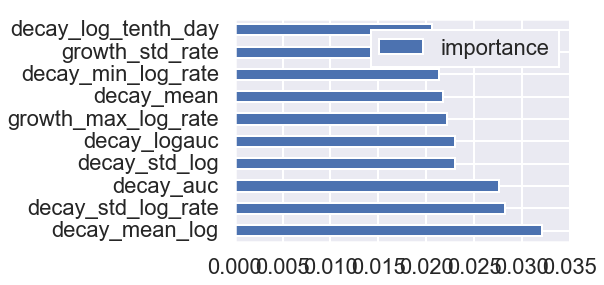

In [36]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Comparison of all Experiments

In [37]:
X = cp.experiments2X(dfc, sample_col='experiment_sample')
metadf = cp.get_meta(dfc)
dfpca = cp.run_pca(X=X, metadf=metadf)

Variance percent explained
 [0.78149607 0.13370993]


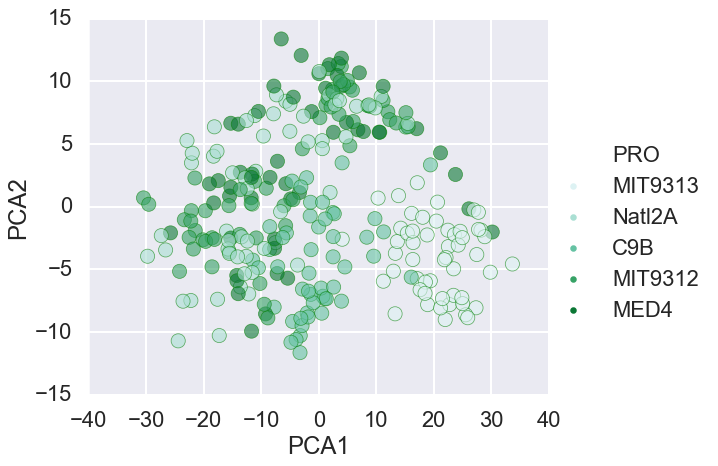

In [38]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder,edgecolor=pedge,
           )


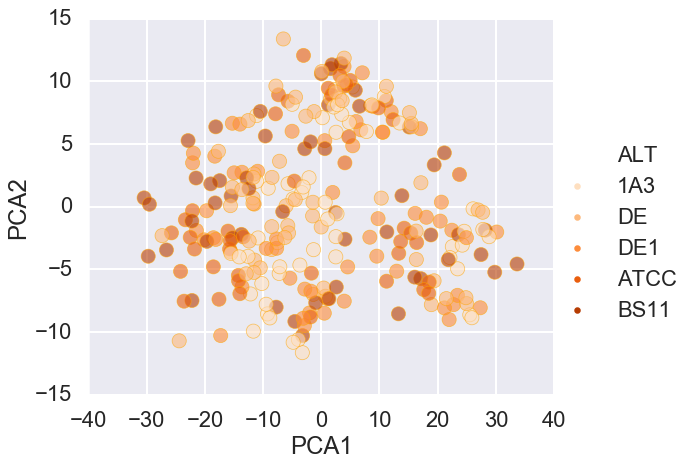

In [39]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2, 
                       palette=apallete, hue_order=aorder, edgecolor=aedge,
)

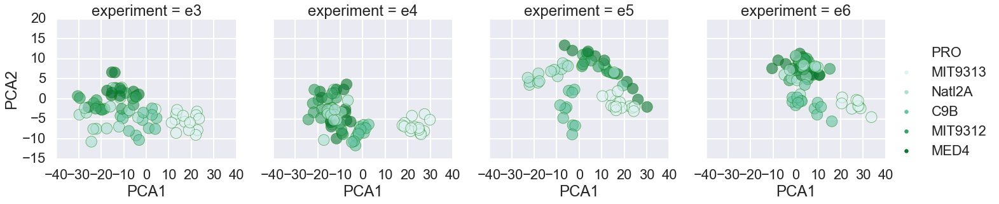

In [40]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', s=300, alpha=0.6,
            col='experiment', height=5,
                       palette=ppallete, hue_order=porder, edgecolor=pedge,
)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

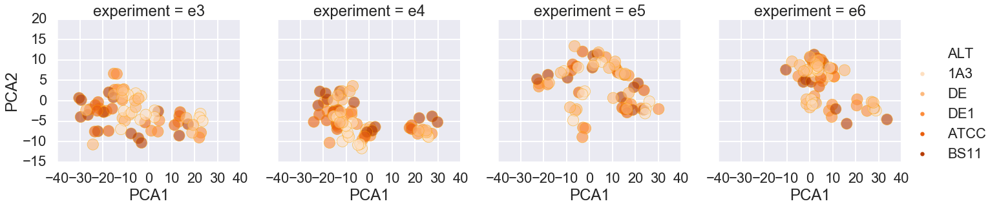

In [41]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', s=300, alpha=0.6,
            col='experiment', height=5,
                                   palette=apallete, hue_order=aorder, edgecolor=aedge,

           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [42]:
X1 = cp.experiments2X(dfc, cumsummode=False)
X1.columns = 'logFL_' + X1.columns.astype(str)
X3 = cp.experiments2X(dfc)
X3.columns = 'cumsumlogFL_' + X3.columns.astype(str)
X2 = cp.experiments2X(dfc, cumsummode=False, value_col='rateFL')
X2.columns = 'rate_' + X2.columns.astype(str)
X = pd.concat([X1, X2, X3], axis=1).fillna(0)
#X1.isna().sum().sum(), X2.isna().sum().sum(), X.isna().sum().sum()
metadf = cp.get_meta(dfc)
dfpca = cp.run_pca(X=X, metadf=metadf)

Variance percent explained
 [0.39490732 0.1441725 ]


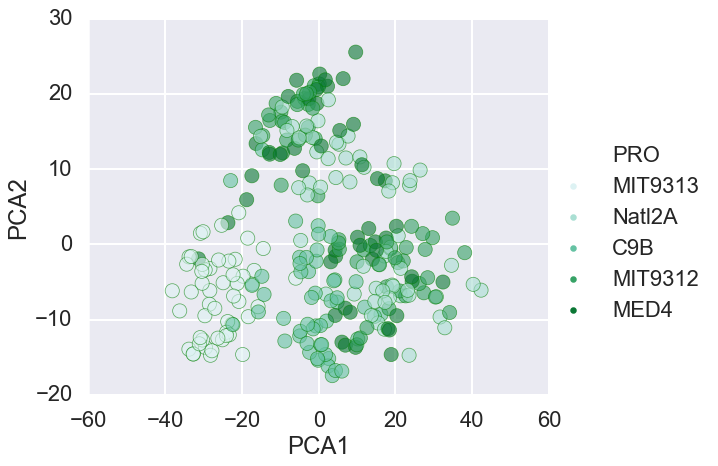

In [43]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder,edgecolor=pedge,
           )


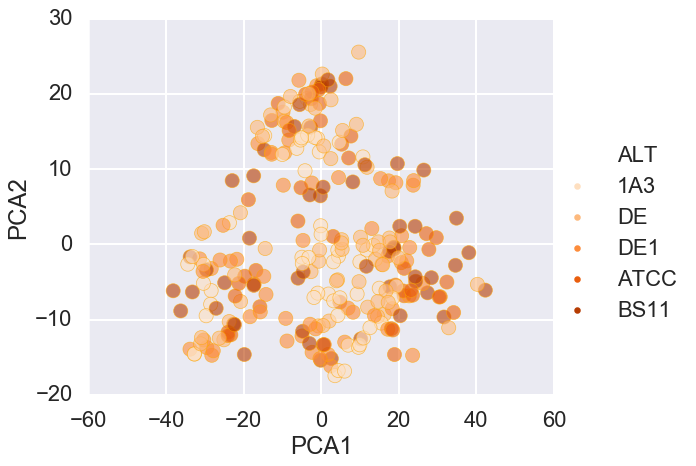

In [44]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2, 
                       palette=apallete, hue_order=aorder, edgecolor=aedge,
)

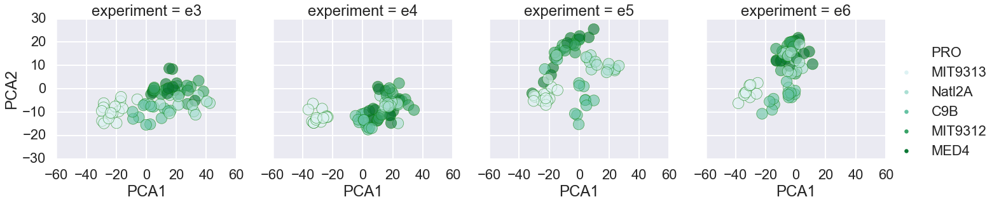

In [45]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', s=300, alpha=0.6,
            col='experiment', height=5,
                       palette=ppallete, hue_order=porder, edgecolor=pedge,
)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

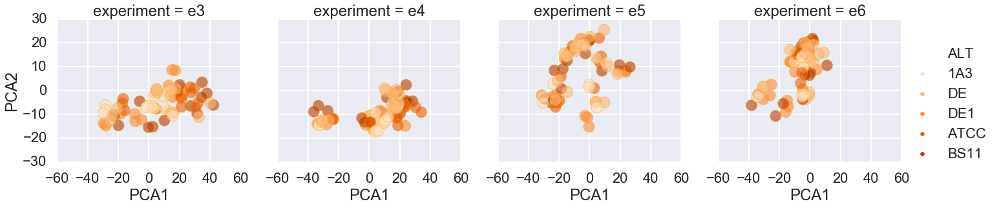

In [46]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', s=300, alpha=0.6,
            col='experiment', height=5,
                                   palette=apallete, hue_order=aorder, edgecolor=aedge,

           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [109]:
X = cp.experiments2X(dfc, cumsummode=False)
#X1.columns = 'logFL_' + X1.columns.astype(str)
#X = X1
#X = cp.experiments2X(df)
metadf = cp.get_meta(dfc)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.8629629629629629


accuracy: 1.0
              precision    recall  f1-score   support

         C9B       1.00      1.00      1.00        51
        MED4       1.00      1.00      1.00        52
     MIT9312       1.00      1.00      1.00        56
     MIT9313       1.00      1.00      1.00        52
      Natl2A       1.00      1.00      1.00        59

   micro avg       1.00      1.00      1.00       270
   macro avg       1.00      1.00      1.00       270
weighted avg       1.00      1.00      1.00       270



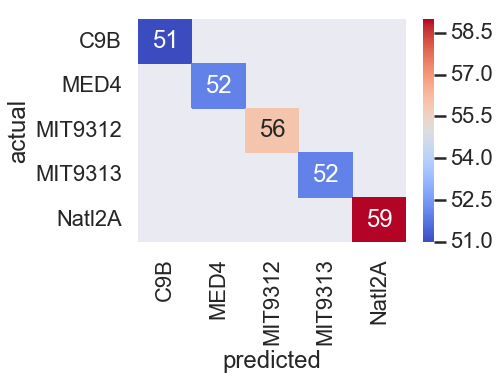

In [48]:
cp.forest_heatmap(clf=clf, X=X, y=y)

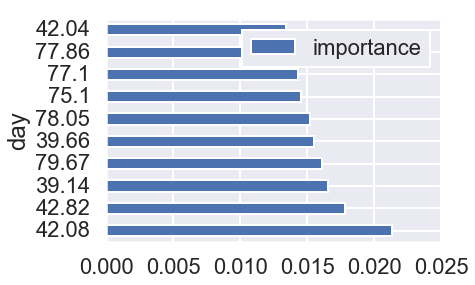

In [49]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [108]:
X = cp.experiments2X(dfc, cumsummode=False)
#X1.columns = 'logFL_' + X1.columns.astype(str)
#X = X1
#X = cp.experiments2X(df)
metadf = cp.get_meta(dfc)
y = metadf['ALT']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.5111111111111111


accuracy: 1.0
              precision    recall  f1-score   support

         1A3       1.00      1.00      1.00        55
        ATCC       1.00      1.00      1.00        44
        BS11       1.00      1.00      1.00        54
          DE       1.00      1.00      1.00        58
         DE1       1.00      1.00      1.00        59

   micro avg       1.00      1.00      1.00       270
   macro avg       1.00      1.00      1.00       270
weighted avg       1.00      1.00      1.00       270



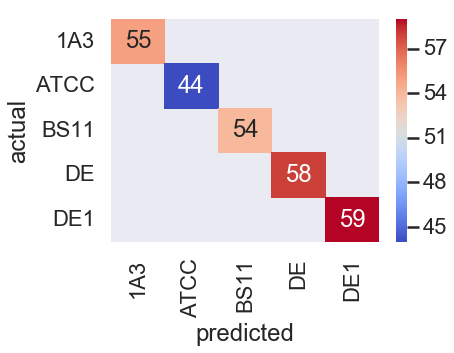

In [51]:
cp.forest_heatmap(clf=clf, X=X, y=y)

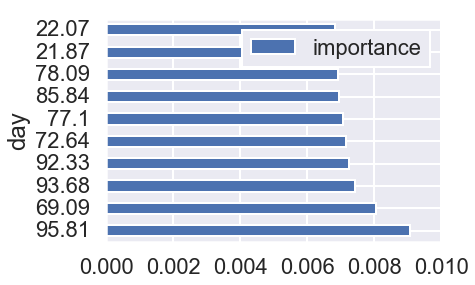

In [52]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [107]:
X1 = cp.experiments2X(dfc, cumsummode=False)
X1.columns = 'logFL_' + X1.columns.astype(str)
X3 = cp.experiments2X(dfc)
X3.columns = 'cumsumlogFL_' + X3.columns.astype(str)
X2 = cp.experiments2X(dfc, cumsummode=False, value_col='rateFL')
X2.columns = 'rate_' + X2.columns.astype(str)
X = pd.concat([X1, X2, X3], axis=1).fillna(0)
#X = cp.experiments2X(df)
metadf = cp.get_meta(dfc)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.8333333333333334


accuracy: 1.0
              precision    recall  f1-score   support

         C9B       1.00      1.00      1.00        51
        MED4       1.00      1.00      1.00        52
     MIT9312       1.00      1.00      1.00        56
     MIT9313       1.00      1.00      1.00        52
      Natl2A       1.00      1.00      1.00        59

   micro avg       1.00      1.00      1.00       270
   macro avg       1.00      1.00      1.00       270
weighted avg       1.00      1.00      1.00       270



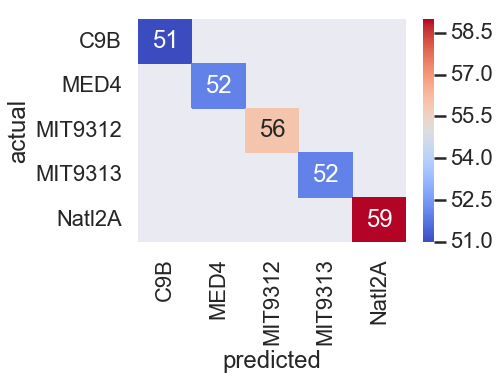

In [54]:
cp.forest_heatmap(clf=clf, X=X, y=y)

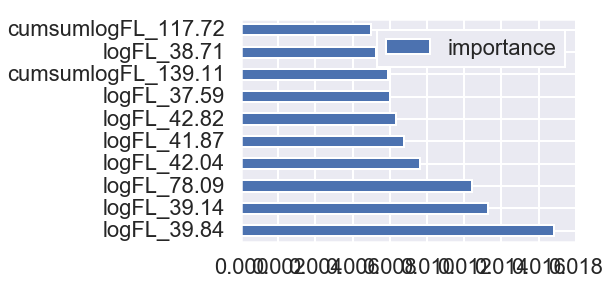

In [55]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Decay Curve

In [56]:
dfd = cp.generate_decay(dfc, sample_col='experiment_sample')
dfd = cp.update_calculated_fields(dfd, group_col='experiment_sample')


In [57]:
max_day = dfd.groupby('experiment_sample')['day'].max()
keep = max_day.loc[max_day > 78].index

dfd = dfd.loc[(dfd.experiment_sample.isin(keep)) & (dfd.day < 80)]

In [58]:
dfd.head()

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture,FL_orig,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL
0,"e3, 10A",0.00,1.000000,e3,10A,C9B,DE,Co_Culture,1.000000,0.000000,1.000000,0.000000,5.143301,NaN,NaN,NaN,NaN,NaN
1,"e3, 10A",1.03,0.727625,e3,10A,C9B,DE,Co_Culture,0.727625,-0.317969,1.727625,-0.317969,3.548186,-0.272375,-0.317969,1.03,-0.264441,-0.308708
2,"e3, 10A",2.14,0.768496,e3,10A,C9B,DE,Co_Culture,0.768496,-0.263319,2.496122,-0.581288,3.787540,0.040871,0.054650,1.11,0.036821,0.049234
3,"e3, 10A",3.10,0.630668,e3,10A,C9B,DE,Co_Culture,0.630668,-0.460975,3.126790,-1.042264,2.980373,-0.137828,-0.197656,0.96,-0.143571,-0.205892
4,"e3, 10A",4.09,0.369332,e3,10A,C9B,DE,Co_Culture,0.369332,-0.996060,3.496122,-2.038324,1.449901,-0.261337,-0.535085,0.99,-0.263976,-0.540490


Text(0.5, 0.98, 'Relative Decline Curve ')

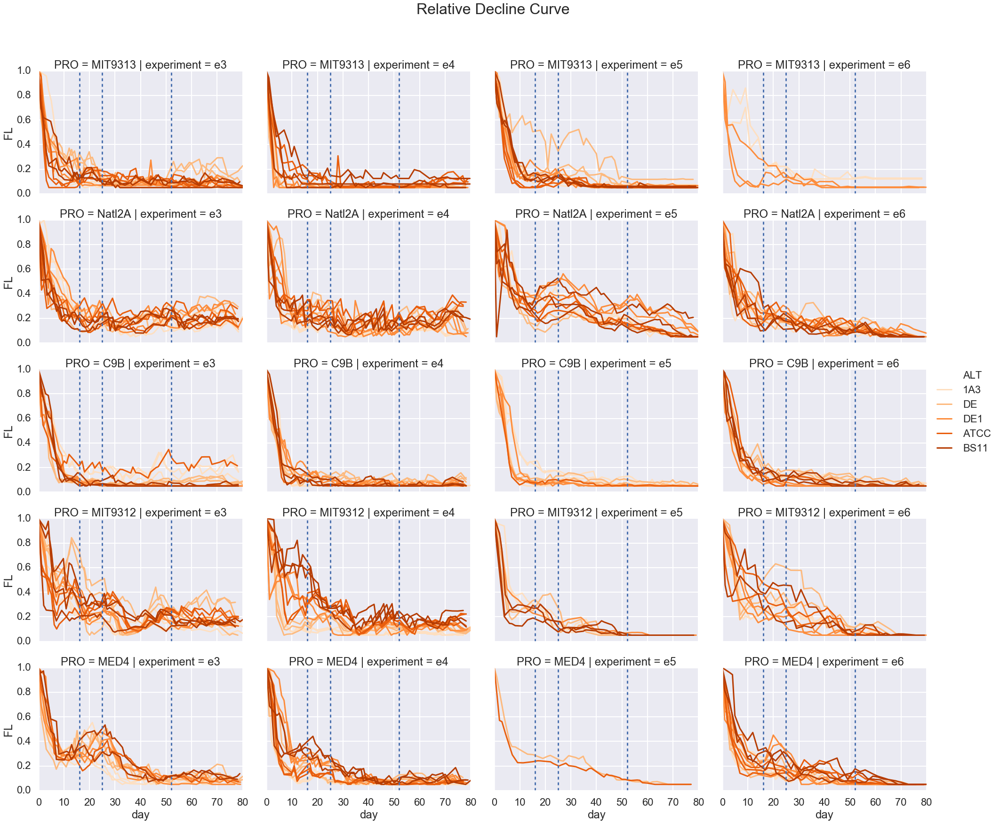

In [59]:
a = sns.relplot(data=dfd, x='day', y='FL', kind='line', #ci='sd',
#            col='PRO', hue='ALT', row='experiment', 
                           estimator=None, units='experiment_sample',
            row='PRO', hue='ALT', col='experiment', row_order=porder,

            palette=apallete, hue_order=aorder,
            aspect=1.4
           )
for l in a.axes:
    for ax in l:
        ax.axvline(16, ls='--', label='17')
        ax.axvline(25, ls='--', label='23')
        ax.axvline(52, ls='--', label='50')
    

# g.fig.get_axes()[0].set_yscale('log')
# for x, y in zip(df['a'], df['b']):
#     ax.hlines(y, 0, x, color='blue')
#     ax.vlines(x, 0, y, color='blue')

#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Relative Decline Curve ", fontsize=32)


In [60]:
X = cp.experiments2X(dfd)
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.85286428 0.09375528]


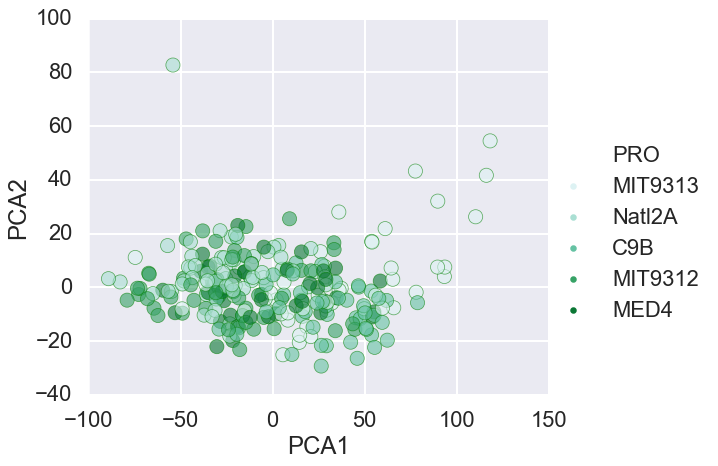

In [61]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder,edgecolor=pedge,
           )


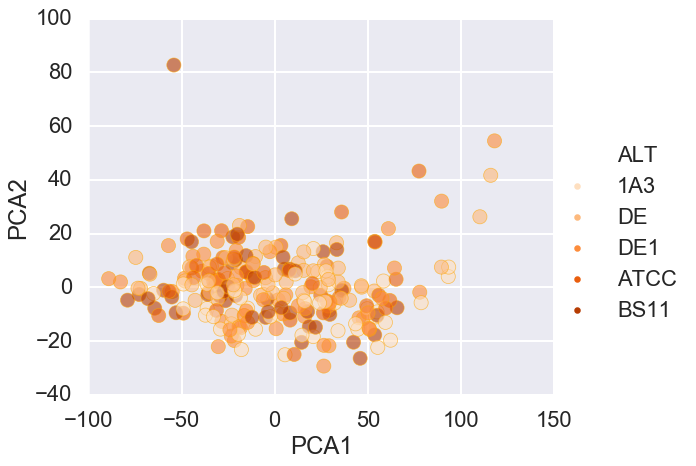

In [62]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2, 
                       palette=apallete, hue_order=aorder, edgecolor=aedge,
)

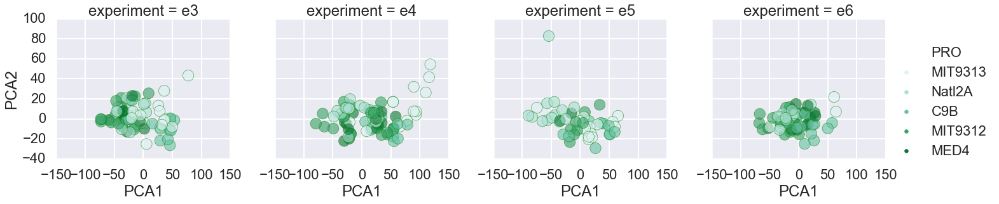

In [63]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', s=300, alpha=0.6,
            col='experiment', height=5,
                       palette=ppallete, hue_order=porder, edgecolor=pedge,
)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

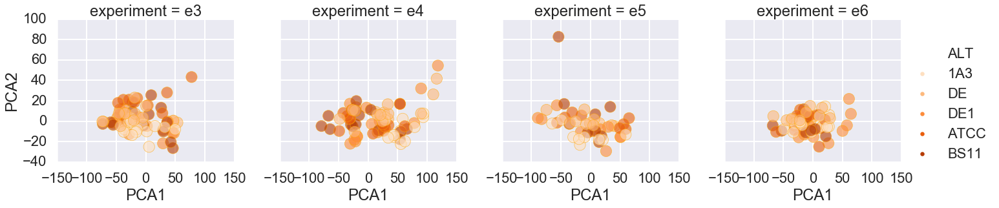

In [64]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', s=300, alpha=0.6,
            col='experiment', height=5,
                                   palette=apallete, hue_order=aorder, edgecolor=aedge,

           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [91]:
X = cp.experiments2X(dfd, cumsummode=False)
#X1.columns = 'logFL_' + X1.columns.astype(str)
#X = X1
#X = cp.experiments2X(df)
metadf = cp.get_meta(dfd)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.6411290322580645


accuracy: 1.0
              precision    recall  f1-score   support

         C9B       1.00      1.00      1.00        49
        MED4       1.00      1.00      1.00        44
     MIT9312       1.00      1.00      1.00        50
     MIT9313       1.00      1.00      1.00        48
      Natl2A       1.00      1.00      1.00        57

   micro avg       1.00      1.00      1.00       248
   macro avg       1.00      1.00      1.00       248
weighted avg       1.00      1.00      1.00       248



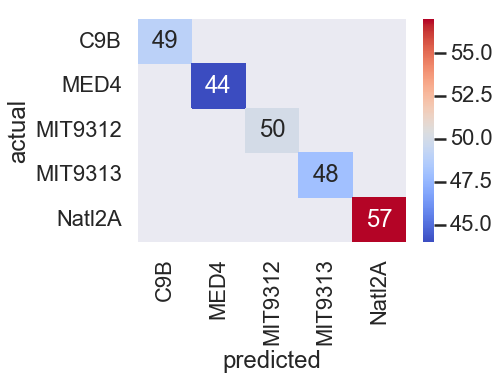

In [92]:
cp.forest_heatmap(clf=clf, X=X, y=y)

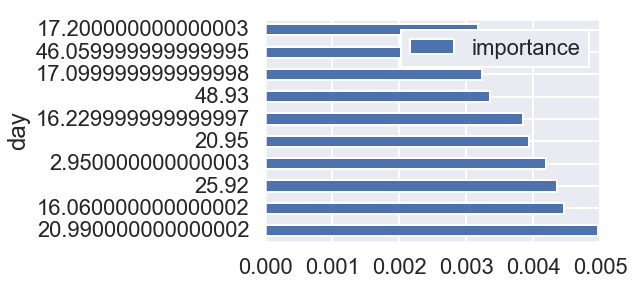

In [93]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [94]:
X = cp.experiments2X(dfd, cumsummode=False)
#X1.columns = 'logFL_' + X1.columns.astype(str)
#X = X1
#X = cp.experiments2X(df)
metadf = cp.get_meta(dfd)
y = metadf['ALT']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.4435483870967742


accuracy: 1.0
              precision    recall  f1-score   support

         1A3       1.00      1.00      1.00        52
        ATCC       1.00      1.00      1.00        41
        BS11       1.00      1.00      1.00        49
          DE       1.00      1.00      1.00        51
         DE1       1.00      1.00      1.00        55

   micro avg       1.00      1.00      1.00       248
   macro avg       1.00      1.00      1.00       248
weighted avg       1.00      1.00      1.00       248



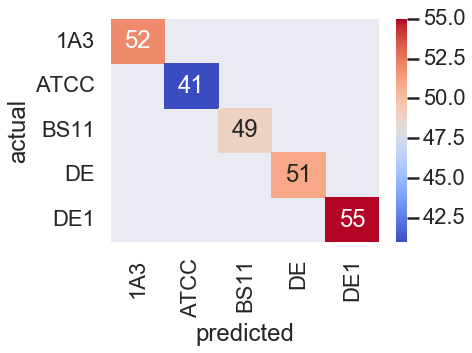

In [95]:
cp.forest_heatmap(clf=clf, X=X, y=y)

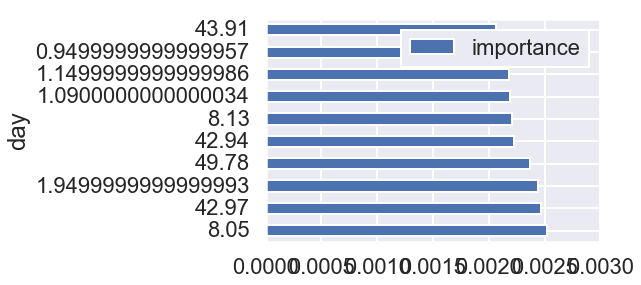

In [96]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [97]:
gdecay = cp.generate_features(df=dfd)

In [98]:
g = gdecay

In [99]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample')

Variance percent explained
 [0.37817821 0.17293231]


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


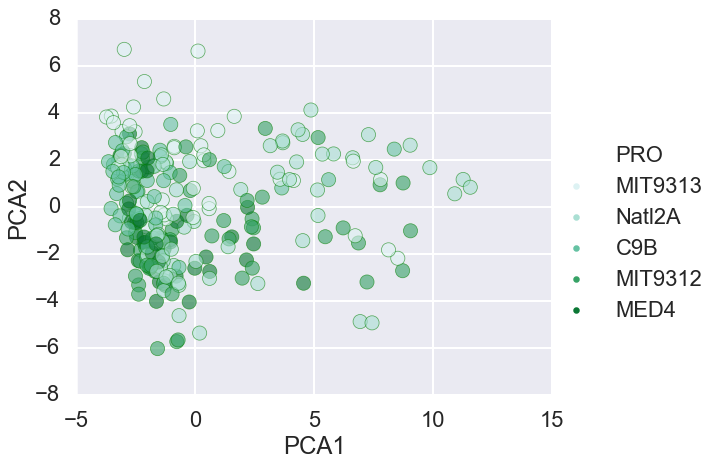

In [100]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder,edgecolor=pedge,
           )

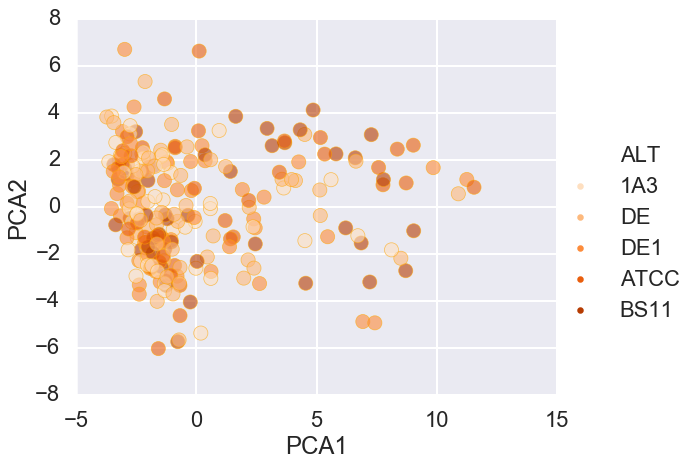

In [101]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT',
            s=200, alpha=0.6, height=7, aspect=1.2, 
                       palette=apallete, hue_order=aorder, edgecolor=aedge,
)

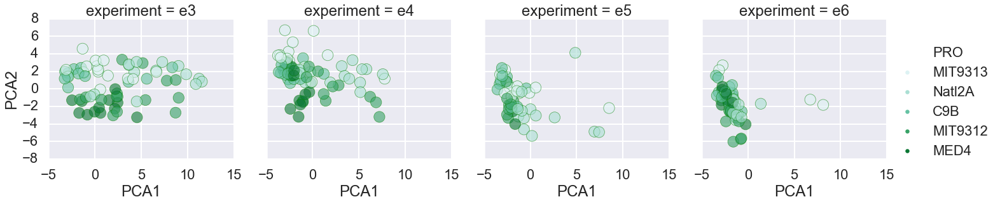

In [102]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', s=300, alpha=0.6,
            col='experiment', height=5,
                       palette=ppallete, hue_order=porder, edgecolor=pedge,
)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

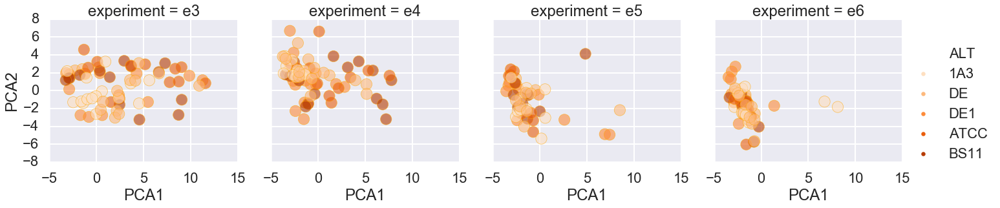

In [103]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', s=300, alpha=0.6,
            col='experiment', height=5,
                                   palette=apallete, hue_order=aorder, edgecolor=aedge,

           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [104]:
X = cp.features2X(g)
y = g['PRO']
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.5887096774193549


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


accuracy: 1.0
              precision    recall  f1-score   support

         C9B       1.00      1.00      1.00        49
        MED4       1.00      1.00      1.00        44
     MIT9312       1.00      1.00      1.00        50
     MIT9313       1.00      1.00      1.00        48
      Natl2A       1.00      1.00      1.00        57

   micro avg       1.00      1.00      1.00       248
   macro avg       1.00      1.00      1.00       248
weighted avg       1.00      1.00      1.00       248



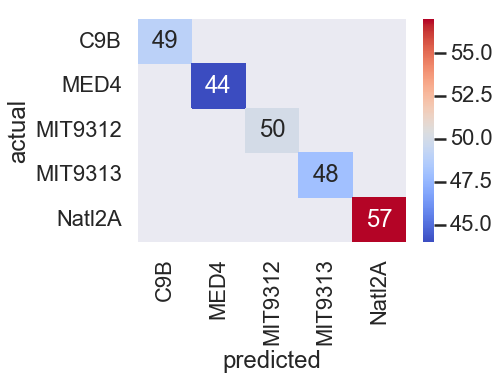

In [105]:
cp.forest_heatmap(clf=clf, X=X, y=y)

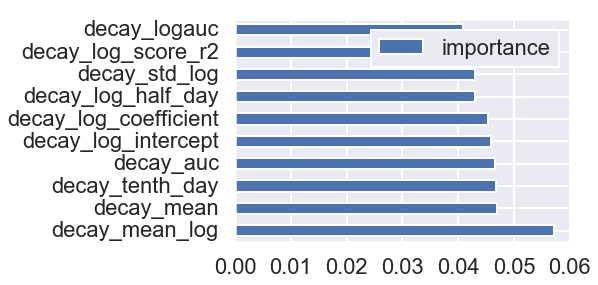

In [80]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [81]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.head()

,importance
decay_mean_log,0.057225
decay_mean,0.047006
decay_tenth_day,0.046724
decay_auc,0.046671
decay_log_intercept,0.045977


In [106]:
X = cp.features2X(g)
y = g['ALT']
clf = cp.forest_classifier(X=X, y=y)

train score 1.0
oob score 0.31048387096774194


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


accuracy: 1.0
              precision    recall  f1-score   support

         1A3       1.00      1.00      1.00        52
        ATCC       1.00      1.00      1.00        41
        BS11       1.00      1.00      1.00        49
          DE       1.00      1.00      1.00        51
         DE1       1.00      1.00      1.00        55

   micro avg       1.00      1.00      1.00       248
   macro avg       1.00      1.00      1.00       248
weighted avg       1.00      1.00      1.00       248



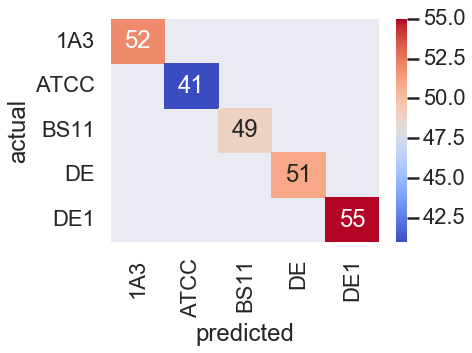

In [83]:
cp.forest_heatmap(clf=clf, X=X, y=y)

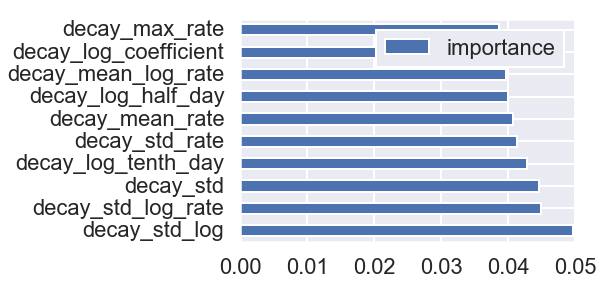

In [84]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [85]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.head()

,importance
decay_std_log,0.049668
decay_std_log_rate,0.044907
decay_std,0.044611
decay_log_tenth_day,0.042784
decay_std_rate,0.041270


# ALT comparisons

In [86]:
g.head()


,max,max_log,max_day,min,min_log,experiment,sample,PRO,ALT,culture,...,decay_min_log,decay_max_log,decay_mean_rate,decay_std_rate,decay_min_rate,decay_max_rate,decay_mean_log_rate,decay_std_log_rate,decay_min_log_rate,decay_max_log_rate
experiment_sample,,,,,,,,,,,,,,,,,,,,,
"e3, 10A",1.0,0.0,0.0,0.050000,-2.995732,e3,10A,C9B,DE,Co_Culture,...,-2.995732,0.0,-0.016089,0.058922,-0.264441,0.036821,-0.040946,0.177776,-0.540490,0.439023
"e3, 10B",1.0,0.0,0.0,0.050000,-2.995732,e3,10B,C9B,DE,Co_Culture,...,-2.995732,0.0,-0.017058,0.057654,-0.260603,0.027296,-0.055559,0.170988,-0.541049,0.307398
"e3, 10C",1.0,0.0,0.0,0.050000,-2.995732,e3,10C,C9B,DE,Co_Culture,...,-2.995732,0.0,-0.018755,0.063224,-0.333781,0.025650,-0.061578,0.194964,-0.793652,0.310436
"e3, 11A",1.0,0.0,0.0,0.057854,-2.849830,e3,11A,MED4,DE1,Co_Culture,...,-2.849830,0.0,-0.016689,0.043653,-0.162979,0.049390,-0.041578,0.130528,-0.393317,0.267535
"e3, 11B",1.0,0.0,0.0,0.050000,-2.995732,e3,11B,MED4,DE1,Co_Culture,...,-2.995732,0.0,-0.016456,0.048697,-0.287967,0.039570,-0.045585,0.132305,-0.515178,0.182804


In [87]:
g.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'experiment', 'sample',
       'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decay_half_day',
       'decay_half_val', 'decay_log_half_day', 'decay_log_half_val',
       'decay_tenth_day', 'decay_tenth_val', 'decay_log_tenth_day',
       'decay_log_tenth_val', 'decay_log_intercept', 'decay_lo

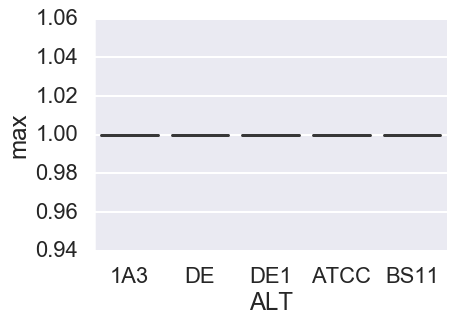

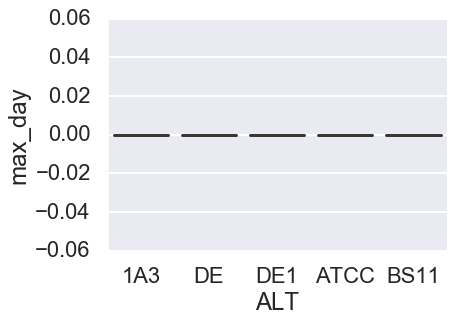

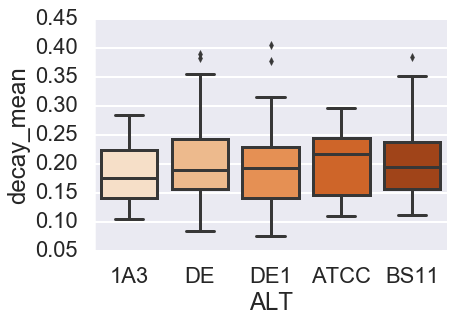

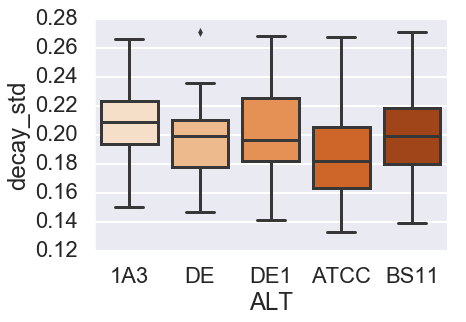

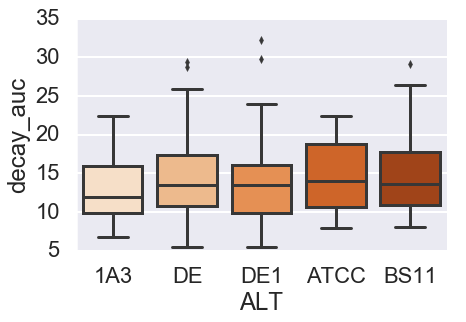

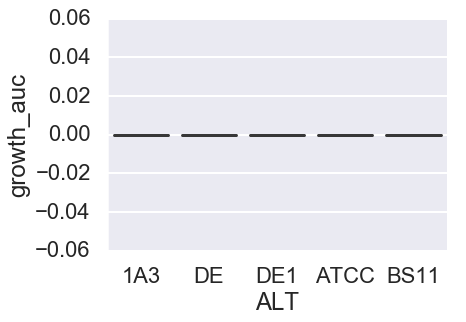

In [88]:
for v in ['max','max_day', 'decay_mean', 'decay_std', 'decay_auc', 'growth_auc', 
         ]:
    sns.catplot(data=g, x='ALT', y=v, 
                kind='box', 
                #kind='', #split=True,
                #hue='PRO', palette=ppallete, hue_order=porder, 
                order=aorder,
                palette=apallete, 
                aspect=1.4)


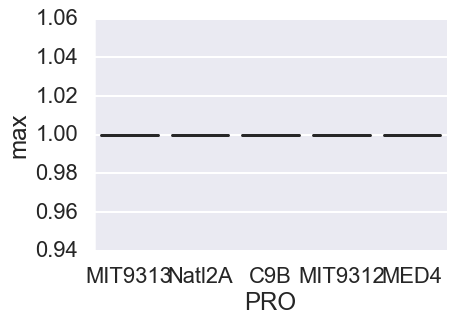

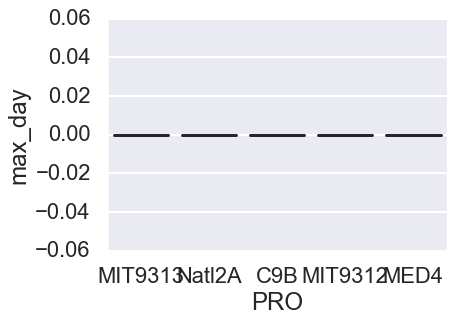

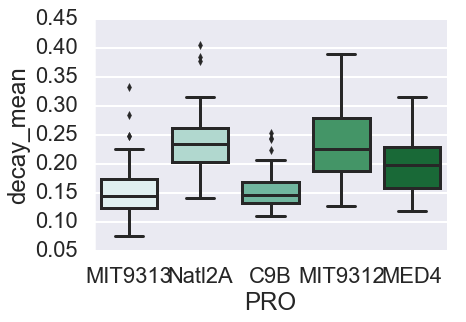

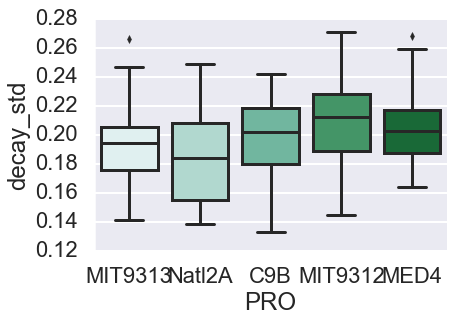

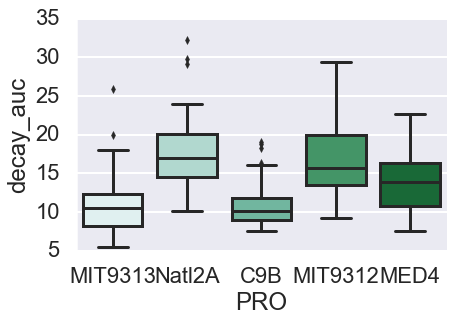

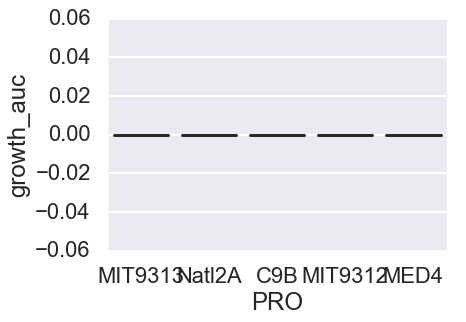

In [89]:
for v in ['max','max_day', 'decay_mean', 'decay_std', 'decay_auc', 'growth_auc', 

         ]:
    sns.catplot(data=g, x='PRO', y=v, 
                kind='box', 
                #kind='', #split=True,
                #hue='PRO', palette=ppallete, hue_order=porder, 
                order=porder,
                palette=ppallete, 
                aspect=1.4)


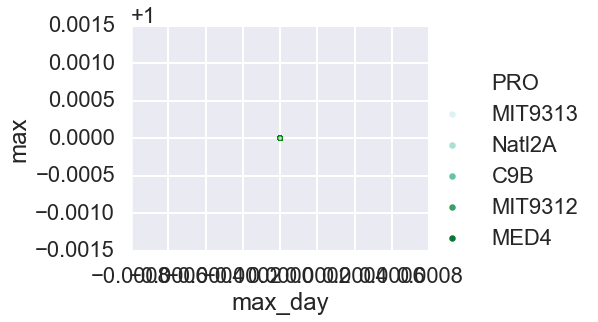

In [90]:
sns.relplot(data=g, x='max_day', y='max', 
            #kind='swarm', 
            #kind='box', #split=True,
            hue='PRO', palette=ppallete, hue_order=porder, 
            #order=aorder,
            #palette=apallete,
            sizes=500, edgecolor=pedge,
            aspect=1.4)